**Pre-processing UW14 with scVelo**

1.   Install required libraries and load Data
2.   Create velocity vectors and kernel






In [ ]:
#!pip install numpy==1.21.6 pandas==1.5.3 matplotlib===3.5.0 scanpy==1.9.1 igraph==0.9.8 scvelo==0.2.4 loompy==3.0.6 anndata==0.8.0

In [1]:
!pip install kaleido cohere openai tiktoken scikit-learn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 9.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 259.5/259.5 kB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 31.6 MB/s eta 0:00:00


In [2]:
!pip install numpy==1.26.0 pandas==2.2.2 matplotlib==3.8.2 scanpy igraph scvelo loompy anndata numba

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.5/58.5 kB 1.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.6/49.6 kB 3.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.2/18.2 MB 60.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.6/11.6 MB 81.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 69.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 66.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 196.8/196.8 kB 14.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 144.5/144.5 kB 11.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.2/58.2 kB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.3/13.3 MB 59.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.8/40.8 kB 3.0 MB/s eta 0:00:00
  Created wheel for loompy: filename=loompy-3.0.8-py3-none-any.whl size=54012 sha256=ff4a8

In [3]:
!pip install leidenalg tensorflow louvain

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 14.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 22.3 MB/s eta 0:00:00


In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as pl
import scanpy as sc
import igraph
import scvelo as scv
import loompy as lmp
import anndata

import warnings
warnings.filterwarnings('ignore')

In [2]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')

In [4]:
adata = sc.read('/content/drive/MyDrive/Colab Notebooks/uw14RNA.loom', cache=True)

# Merge velocyto and cellranger outputs
#Neutro3p = scv.utils.merge(Neutro3p, VelNeutro3p)
#/content/RNA.loom
adata

... writing an h5ad cache file to speedup reading next time


AnnData object with n_obs × n_vars = 5085 × 33538
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

In [5]:
uw14_seurat = sc.read("/content/drive/MyDrive/Colab Notebooks/UW14seurat2.h5ad")
uw14_seurat

AnnData object with n_obs × n_vars = 2587 × 9947
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'RNA_snn_res.0.3', 'seurat_clusters', 'GROUP_time', 'State', 'Celltype'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable'
    obsm: 'X_harmony', 'X_pca', 'X_umap'
    varm: 'HARMONY', 'PCs'

In [6]:
#remove observations or features not present on seurat

adata_new = adata[uw14_seurat.obs_names.intersection(adata.obs_names),]

In [7]:
adata_new.obs['seurat_clusters'] = uw14_seurat.obs['seurat_clusters']
adata_new.obsm['X_umap'] = uw14_seurat.obsm['X_umap']

In [ ]:
adata.var_names

Index(['FAM138A', 'AL627309.1', 'AL627309.3', 'AL627309.2', 'OR4F29', 'OR4F16',
       'LINC00115', 'FAM41C', 'AL645608.1', 'NOC2L',
       ...
       'TTTY17A', 'TTTY4', 'BPY2', 'DAZ2', 'TTTY17B', 'TTTY4B', 'BPY2B',
       'DAZ4', 'CDY1', 'TTTY3'],
      dtype='object', name='Gene', length=33538)

In [ ]:
uw14_seurat.var_names

Index(['AL669831.5', 'NOC2L', 'ISG15', 'AGRN', 'C1orf159', 'SDF4', 'UBE2J2',
       'ACAP3', 'INTS11', 'CPTP',
       ...
       'MT-ATP6', 'MT-CO3', 'MT-ND3', 'MT-ND4L', 'MT-ND4', 'MT-ND5', 'MT-ND6',
       'MT-CYB', 'AL592183.1', 'AL354822.1'],
      dtype='object', length=9947)

In [10]:
##2set
adata_new.var['mt'] = adata_new.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata_new, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

In [12]:
##2set
adata_new = adata_new[adata_new.obs.pct_counts_mt < 10, :]
adata_new

View of AnnData object with n_obs × n_vars = 2586 × 33538
    obs: 'seurat_clusters', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    obsm: 'X_umap'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

In [13]:
##2set
keep = (adata_new.obs['n_genes_by_counts'] < 7000) & (adata_new.obs['n_genes_by_counts'] > 100)
adata_new = adata_new[keep, :]
print("Remaining cells %d"%adata_new.n_obs)

Remaining cells 2586


In [14]:
##2nset

sc.pp.normalize_total(adata_new, target_sum=1e4)
sc.pp.log1p(adata_new)

normalizing counts per cell
    finished (0:00:00)


extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


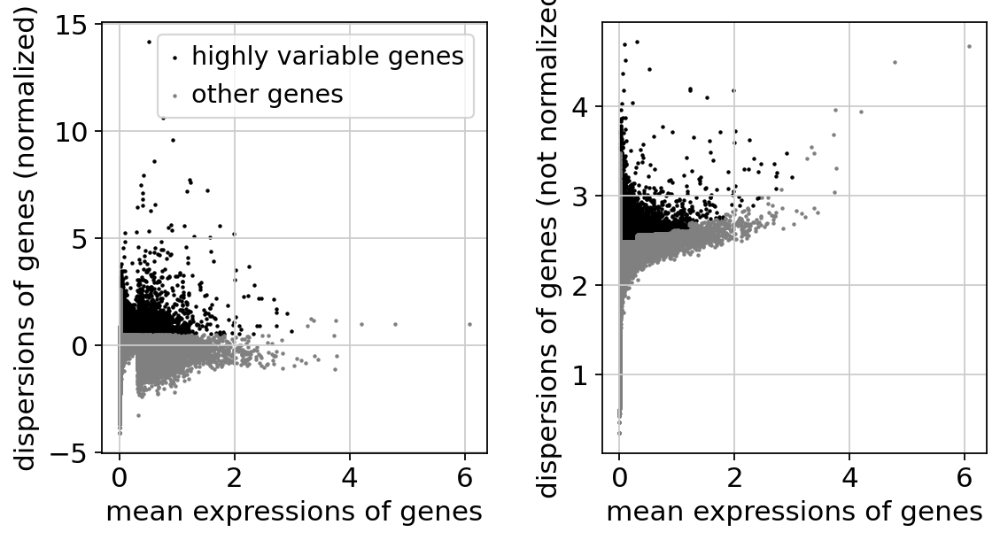

In [15]:
##2set
sc.pp.highly_variable_genes(adata_new, min_mean=0.0125, max_mean=3, min_disp=0.5)
sc.pl.highly_variable_genes(adata_new)

In [16]:
##2set
adata_new = adata_new[:, adata_new.var['highly_variable']]
adata_new

View of AnnData object with n_obs × n_vars = 2586 × 4988
    obs: 'seurat_clusters', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'
    obsm: 'X_umap'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

In [17]:
##2set
sc.pp.regress_out(adata_new, ['total_counts', 'pct_counts_mt'])
sc.pp.scale(adata_new, max_value=10)

regressing out ['total_counts', 'pct_counts_mt']
    sparse input is densified and may lead to high memory use
    finished (0:00:07)


In [ ]:
#sc.pp.neighbors(adata, n_neighbors=30, n_pcs=40)
#sc.tl.leiden(adata, resolution = 1.2)
#sc.tl.umap(adata)

computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
running Leiden clustering
    finished: found 12 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:07)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:15)


In [ ]:
#Addn
sc.pp.neighbors(adata, n_neighbors=30, n_pcs=18)
sc.tl.leiden(adata, resolution = 1.2)
sc.tl.umap(adata)

computing neighbors
    using 'X_pca' with n_pcs = 18
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)
running Leiden clustering
    finished: found 14 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:06)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:14)


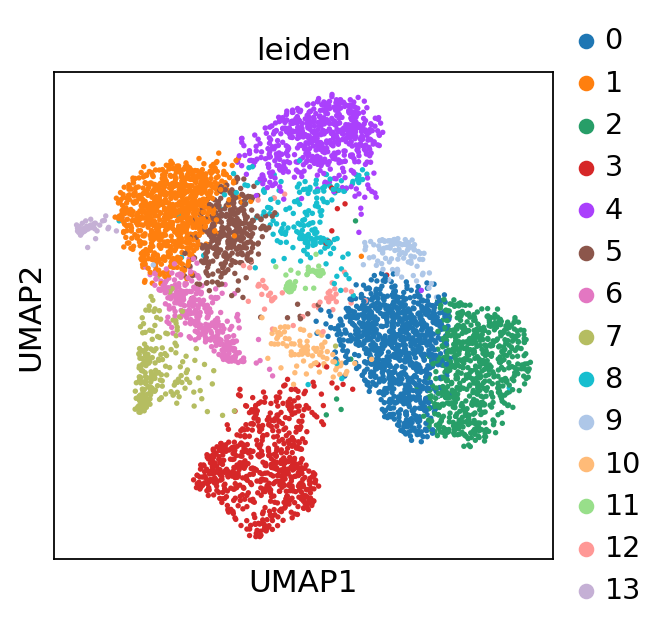

In [ ]:
sc.pl.umap(adata, color=['leiden'])

In [19]:
sam_meta = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/metadata_conv_uw144RNAvel.txt", sep='\t')

In [20]:
sam_meta2 = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/metadata_conv_uw14_RNAvel_all.txt", sep='\t')

In [21]:
adata_new.obs['cell_state'] = sam_meta['State']
adata_new.obs['cellT_seurat'] = sam_meta2['Celltype']

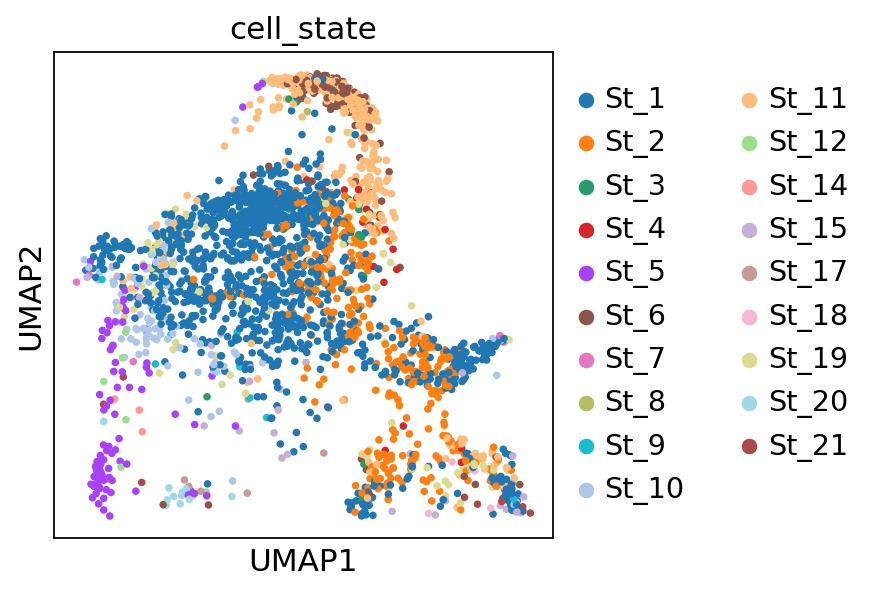

In [22]:
sc.pl.umap(adata_new, color= 'cell_state')

In [ ]:
adata_new

,Accession,Chromosome,End,Start,Strand
Gene,,,,,
FAM138A,ENSG00000237613,1,36081,34554,-
AL627309.1,ENSG00000238009,1,133723,89295,-
AL627309.3,ENSG00000239945,1,91105,89551,-
AL627309.2,ENSG00000239906,1,140339,139790,-
OR4F29,ENSG00000284733,1,451697,450703,-
...,...,...,...,...,...
TTTY4B,ENSG00000235412,Y,24607025,24570202,+
BPY2B,ENSG00000183795,Y,24639207,24607560,+
DAZ4,ENSG00000205916,Y,24907040,24833843,+


In [ ]:
sam_meta2['Celltype'].mask(sam_meta2['Celltype'] == 'CC_oligodendrocyte', 'Oligodendrocytes', inplace=True)
sam_meta2['Celltype'].mask(sam_meta2['Celltype'] == 'CC_Neuron', 'Neurons', inplace=True)
sam_meta2['Celltype'].mask(sam_meta2['Celltype'] == 'CC_astrocyte', 'Astrocyte', inplace=True)
sam_meta2['Celltype'].mask(sam_meta2['Celltype'] == 'CC_microglial', 'Microglia', inplace=True)
sam_meta2['Celltype'].mask(sam_meta2['Celltype'] == 'CC_dGSC', 'dGSC2', inplace=True)
sam_meta2['Celltype'].mask(sam_meta2['Celltype'] == 'TC_4', 'Unknown', inplace=True)
sam_meta2['Celltype'].mask(sam_meta2['Celltype'] == 'dGSC_Oligodendrocyte', 'dGSC', inplace=True)
sam_meta2['Celltype'].mask(sam_meta2['Celltype'] == 'CC_endothelial cell', 'Endothelial cell', inplace=True)
sam_meta2['Celltype'].mask(sam_meta2['Celltype'] == 'dGSC_Neuron', 'Neuron developmental', inplace=True)
sam_meta2['Celltype'].mask(sam_meta2['Celltype'] == 'CC_Stem cell', 'Stem cell', inplace=True)


In [ ]:
#adata.obs['cellT_seurat'] = sam_meta2['Celltype']
#adata.obs['Condition'] = sam_meta['GROUP_time']
#adata.obs['cell_state'] = sam_meta['State']

In [23]:
adata_new.obs.head()

,seurat_clusters,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,cell_state,cellT_seurat
CellID,,,,,,,
RNA:AAACCCAAGCAGCGATx,0,1327,1874.0,2.0,0.106724,St_2,CC_Neuron
RNA:AAACCCAGTCGTTGCGx,6,643,814.0,0.0,0.000000,St_11,CC_astrocyte
RNA:AAACGAAGTAAGAACTx,2,851,1114.0,1.0,0.089767,St_1,CC_dGSC
RNA:AAACGCTAGAGGACTCx,1,526,617.0,2.0,0.324149,St_1,GC-like
RNA:AAACGCTAGCATGCAGx,0,881,1225.0,1.0,0.081633,St_1,CC_Neuron


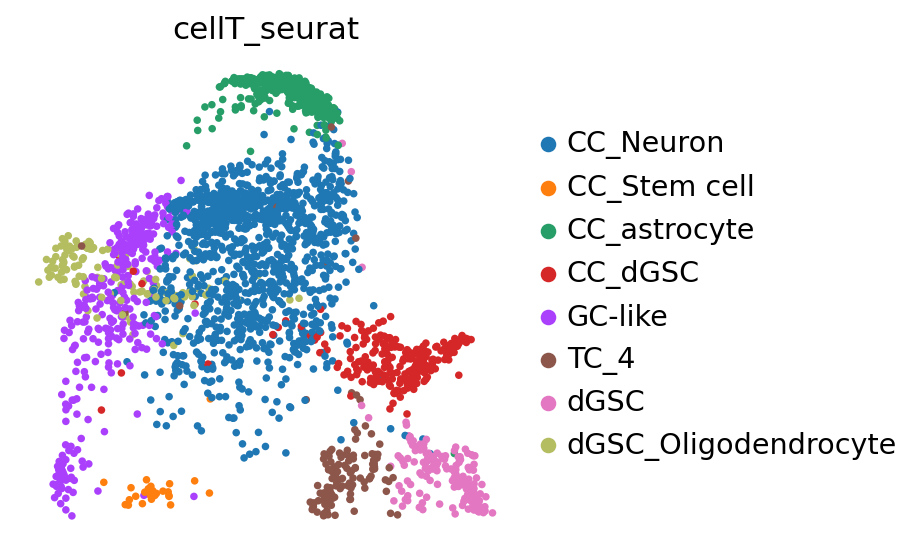

In [24]:
sc.pl.umap(adata_new, color='cellT_seurat', frameon=False, save = "UMAP_UW14_scvelo_cellType.pdf")

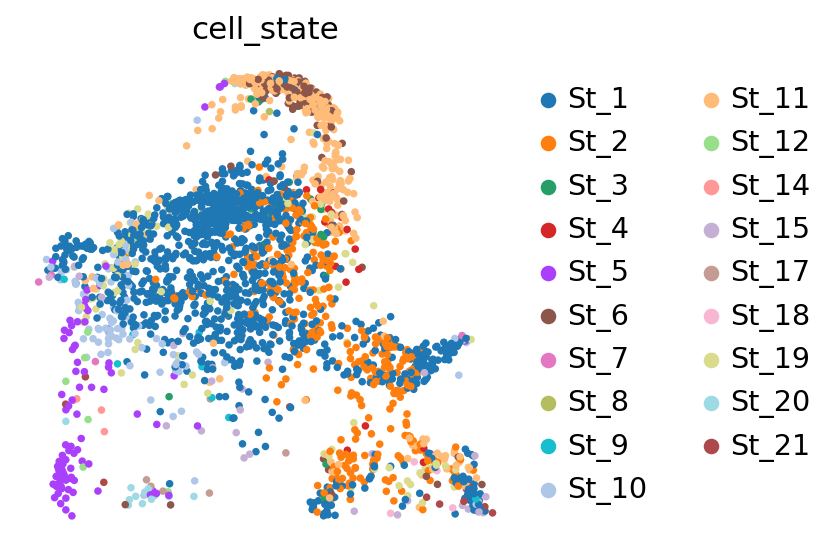

In [25]:
sc.pl.umap(adata_new, color='cell_state', frameon=False, save = "UMAP_UW14_scvelo_cellState.pdf")

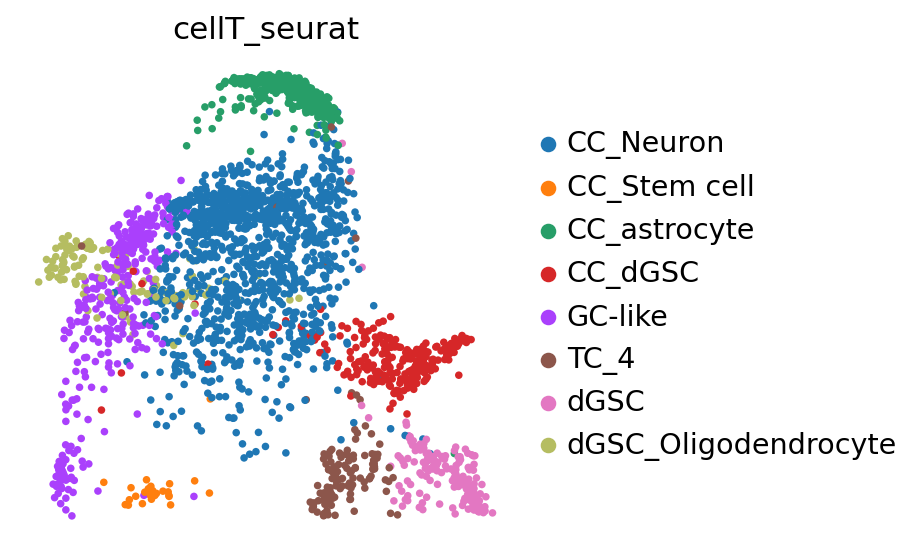

In [ ]:
sc.pl.umap(adata_new, color='cellT_seurat', frameon=False)

In [ ]:
adata.obs[['leiden','cellT_seurat']].to_dict()


/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


{'leiden': {'RNA:AAACCCATCTGCGTCTx': '13',
  'RNA:AAAGAACCAACTGCCGx': '0',
  'RNA:AAAGGATTCTAGCCAAx': '1',
  'RNA:AACCACATCGGCCAACx': '1',
  'RNA:AACAACCAGAAGAACGx': '2',
  'RNA:AACCATGAGGGATCGTx': '6',
  'RNA:AAAGAACTCCAACTGAx': '1',
  'RNA:AACAACCGTACTCCCTx': '4',
  'RNA:AAACGCTAGGATCATAx': '3',
  'RNA:AAAGTGAAGGTCCGAAx': '2',
  'RNA:AAAGTCCAGTCCCAATx': '4',
  'RNA:AAAGGATGTGATTCACx': '3',
  'RNA:AACAAGAGTGCTAGCCx': '1',
  'RNA:AACAAGAAGTGTTGTCx': '10',
  'RNA:AACAACCCAGTTGTTGx': '13',
  'RNA:AAAGGGCAGAAGGGATx': '1',
  'RNA:AAAGGATGTCGGCCTAx': '6',
  'RNA:AACAACCTCTGCTTATx': '2',
  'RNA:AACAAGAAGAATGTTGx': '2',
  'RNA:AAACGCTGTAGGCAGTx': '4',
  'RNA:AAAGTGAAGCTTACGTx': '10',
  'RNA:AAATGGACATAGAAACx': '8',
  'RNA:AACAAGACAAAGTGTAx': '7',
  'RNA:AACCACAAGATCCAAAx': '4',
  'RNA:AAAGTGATCAGGTAAAx': '0',
  'RNA:AAACGAAGTGGTCTGCx': '3',
  'RNA:AACACACAGCGCCTTGx': '11',
  'RNA:AAAGGTAGTTGGATCTx': '9',
  'RNA:AAAGGTACAGGTTTACx': '7',
  'RNA:AAAGGATCACTAGGTTx': '0',
  'RNA:AAAGGTACAAGGGTCAx'

In [26]:
adatastS = adata_new[adata_new.obs['cell_state'].isin(['St_1','St_2','St_5', 'St_6'])]

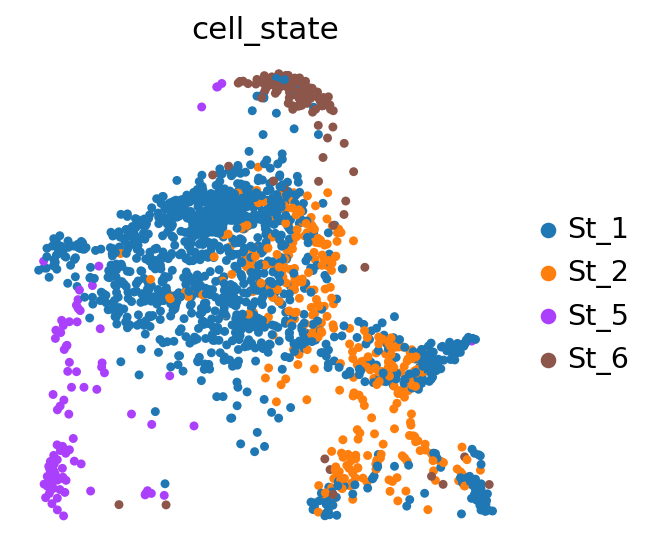

In [27]:
sc.pl.umap(adatastS, color='cell_state', legend_loc = 'right margin', frameon= False , save="UMAP_UW14_cells_state2_sub.pdf")

In [28]:
adata_new.obs['cell_state'].value_counts()

,count
cell_state,
St_1,1248
St_11,387
St_2,376
St_6,141
St_19,110
St_5,93
St_10,86
St_15,30
St_3,26


**Cellrank analysis**

1. Velocity Kernel
2. Cell state probability

In [29]:
import sys

if "google.colab" in sys.modules:
    !pip install -q git+https://github.com/theislab/cellrank

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 522.2/522.2 kB 10.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 68.7/68.7 kB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.6/133.6 kB 8.8 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torch 2.6.0+cu124 requires nvidia-cublas-cu12==12.4.5.8; platform_system == "Linux" and platform_machine == "x86_64", but you have nvidia-cublas-cu12 12.5.3.2 which is incompatible.
torch 2.6.0+cu124 requires nvidia-cuda-cupti-cu12==12.4.127; platform_system == "Linux" and platform_machine == "x86_64", but you have nvidia-cuda-cupti-cu12 12.5.82 which is incompatible.
torch 2.6.0+cu124 requires nvidia-cuda-

In [30]:
import cellrank as cr

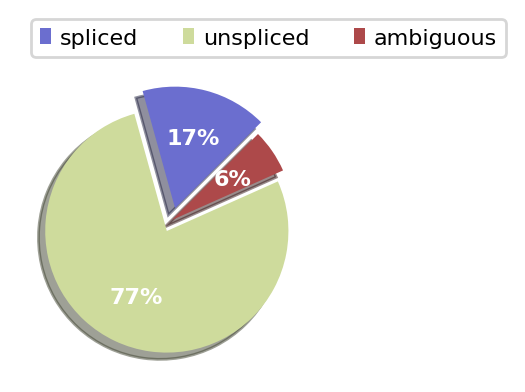

AnnData object with n_obs × n_vars = 2586 × 4988
    obs: 'seurat_clusters', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'cell_state', 'cellT_seurat'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'cell_state_colors', 'cellT_seurat_colors'
    obsm: 'X_umap'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

In [31]:
#scv.pl.proportions(adata)
scv.pl.proportions(adata_new)
adata_new

In [32]:
#scv.pp.moments(adata, n_pcs=None, n_neighbors=None)
#scv.pp.moments(adata_new, n_pcs=None, n_neighbors=None)
scv.pp.moments(adata_new, n_pcs=30, n_neighbors=30)

Normalized count data: spliced, unspliced.
computing PCA
    with n_comps=30


<ipython-input-32-dcf5ca3aa740>:3: DeprecationWarning: Automatic neighbor calculation is deprecated since scvelo==0.4.0 and will be removed in a future version of scVelo. Please compute neighbors first with Scanpy.
  scv.pp.moments(adata_new, n_pcs=30, n_neighbors=30)
/usr/local/lib/python3.11/dist-packages/scvelo/preprocessing/moments.py:71: DeprecationWarning: `neighbors` is deprecated since scvelo==0.4.0 and will be removed in a future version of scVelo. Please compute neighbors with Scanpy.
  neighbors(
/usr/local/lib/python3.11/dist-packages/scvelo/preprocessing/neighbors.py:233: DeprecationWarning: Automatic computation of PCA is deprecated since scvelo==0.4.0 and will be removed in a future version of scVelo. Please compute PCA with Scanpy first.
  _set_pca(adata=adata, n_pcs=n_pcs, use_highly_variable=use_highly_variable)


    finished (0:00:03)
computing neighbors
    finished (0:00:36) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:01) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [33]:
#scv.tl.recover_dynamics(adata, n_jobs=8)
scv.tl.recover_dynamics(adata_new, n_jobs=8)


recovering dynamics (using 2/2 cores)


  0%|          | 0/620 [00:00<?, ?gene/s]

    finished (0:03:43) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)


In [34]:
##2set
scv.tl.velocity(adata_new, mode="dynamical")
vk = cr.kernels.VelocityKernel(adata_new)
vk.compute_transition_matrix()

computing velocities
    finished (0:00:01) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
Computing transition matrix using `'deterministic'` model


  0%|          | 0/2586 [00:00<?, ?cell/s]

Using `softmax_scale=9.4637`


  0%|          | 0/2586 [00:00<?, ?cell/s]

    Finish (0:00:19)


VelocityKernel[n=2586, model='deterministic', similarity='correlation', softmax_scale=9.464]

In [35]:
##2set
ck = cr.kernels.ConnectivityKernel(adata_new)
ck.compute_transition_matrix()

combined_kernel = 0.8 * vk + 0.2 * ck

Computing transition matrix based on `adata.obsp['connectivities']`
    Finish (0:00:00)


In [36]:
print(combined_kernel)

(0.8 * VelocityKernel[n=2586] + 0.2 * ConnectivityKernel[n=2586])


Projecting transition matrix onto `umap`
Adding `adata.obsm['T_fwd_umap']`
    Finish (0:00:01)


/usr/local/lib/python3.11/dist-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/usr/local/lib/python3.11/dist-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/usr/local/lib/python3.11/dist-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/usr/local/lib/python3.11/dist-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and wi

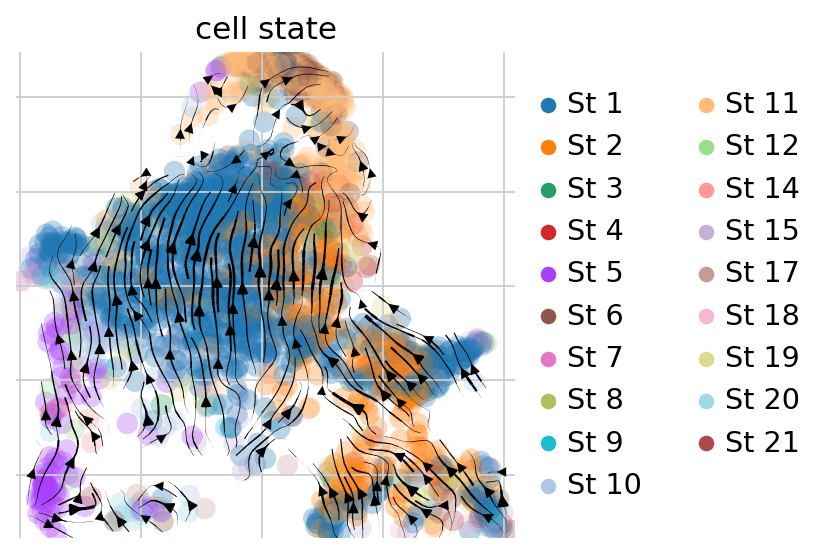

In [37]:
##2set
vk.plot_projection(color="cell_state", legend_loc='right')

In [43]:
scv.tl.recover_latent_time(adata_new)

computing PCA
    with n_comps=30
    finished (0:00:00)
computing velocity graph (using 1/2 cores)


  0%|          | 0/2586 [00:00<?, ?cells/s]

    finished (0:00:05) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing terminal states
    identified 0 region of root cells and 1 region of end points .
    finished (0:00:01) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
computing latent time using root_cells as prior
    finished (0:00:01) --> added 
    'latent_time', shared time (adata.obs)


Using precomputed projection `adata.obsm['T_fwd_umap']`


/usr/local/lib/python3.11/dist-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/usr/local/lib/python3.11/dist-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/usr/local/lib/python3.11/dist-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/usr/local/lib/python3.11/dist-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and wi

figure cannot be saved as pdf, using png instead (can only output finite numbers in pdf).
saving figure to file ./figures/scvelo_UW14_cellState_velocity_projection.png


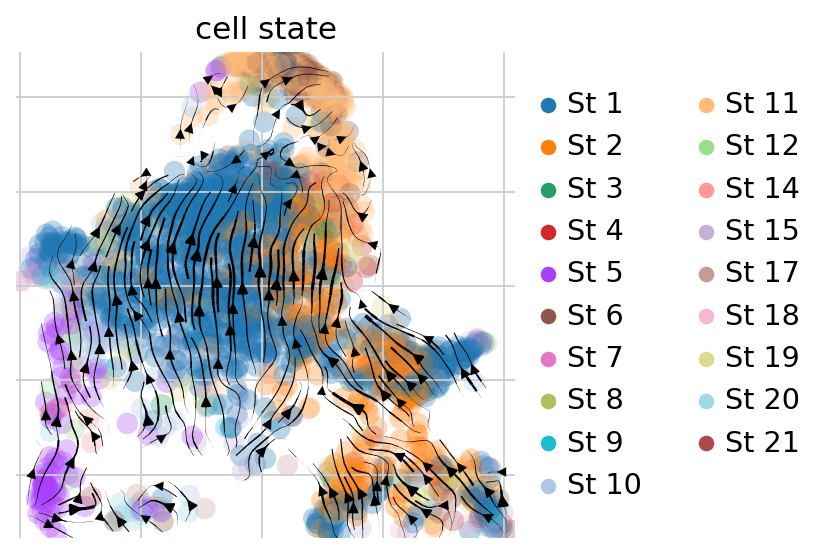

In [39]:
vk.plot_projection(color="cell_state", legend_loc='right', save= "UW14_cellState_velocity_projection.pdf")

computing terminal states
    identified 4 regions of root cells and 2 regions of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
computing latent time using root_cells as prior
    finished (0:00:03) --> added 
    'latent_time', shared time (adata.obs)


/usr/local/lib/python3.11/dist-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/usr/local/lib/python3.11/dist-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])


saving figure to file ./figures/scvelo_heatmap_scVelo-heatmap-latent_time.png


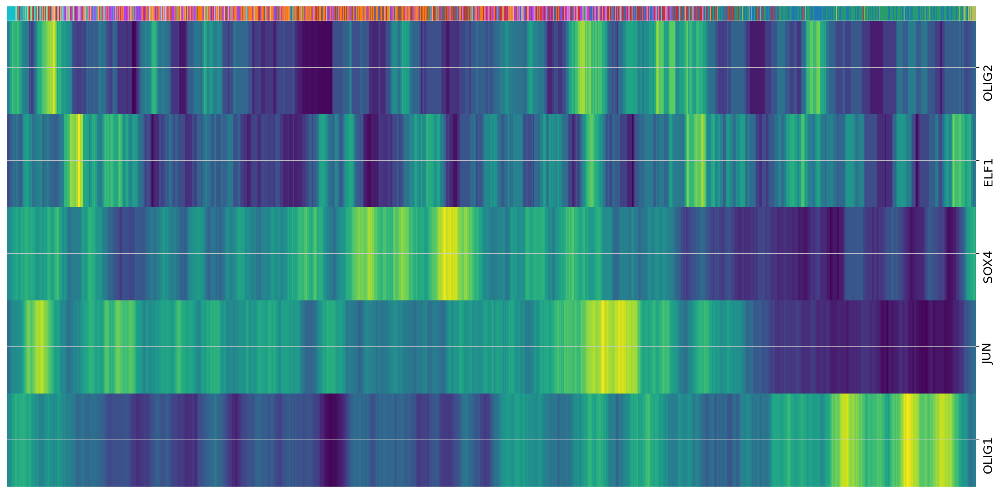

In [ ]:
scv.tl.recover_latent_time(adata)
Genes=["NRXN1","JUN","ELF1","RFX4","ZIC1","MTERF1","MEIS1","SOX4","OLIG1","OLIG2","SOX2"]
scv.pl.heatmap(adata, var_names=Genes, sortby='latent_time', col_color='leiden', n_convolve=100,figsize=(16,8),yticklabels=True,sort=True,colorbar=True,show=True,layer="count", save='scVelo-heatmap-latent_time.png')

computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


/usr/local/lib/python3.11/dist-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/usr/local/lib/python3.11/dist-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/usr/local/lib/python3.11/dist-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/usr/local/lib/python3.11/dist-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and wi

figure cannot be saved as pdf, using png instead (can only output finite numbers in pdf).
saving figure to file ./figures/scvelo_scVelo-umap-latent_time_UW14.png


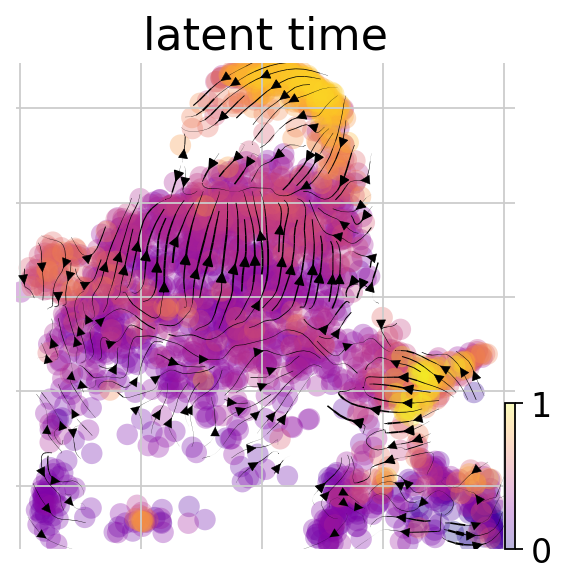

In [44]:
scv.pl.velocity_embedding_stream(adata_new,basis="umap",color="latent_time",fontsize=20,legend_fontsize=20,min_mass=2,color_map="plasma",save='scVelo-umap-latent_time_UW14.pdf')

In [45]:
vk.write_to_adata()
adata_new.write(
    "UW14_scvelocity_kernel_state_v1_23May25.h5ad", compression="gzip"
)

In [46]:
g = cr.estimators.GPCCA(vk)
print(g)

GPCCA[kernel=VelocityKernel[n=2586], initial_states=None, terminal_states=None]


Computing Schur decomposition
Adding `adata.uns['eigendecomposition_fwd']`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:24)
Calculating minChi criterion in interval `[3, 5]`
Computing `4` macrostates
Adding `.macrostates`
       `.macrostates_memberships`
       `.coarse_T`
       `.coarse_initial_distribution
       `.coarse_stationary_distribution`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:01)


/usr/local/lib/python3.11/dist-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/usr/local/lib/python3.11/dist-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/usr/local/lib/python3.11/dist-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/usr/local/lib/python3.11/dist-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and wi

saving figure to file ./figures/scvelo_UW14_macrostates.pdf


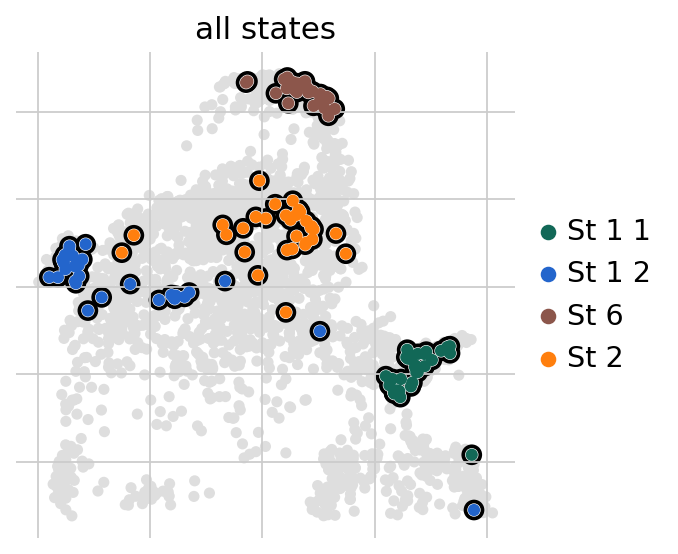

In [48]:
g.fit(cluster_key="cell_state", n_states=[2, 5])
g.plot_macrostates(which="all", discrete=True, legend_loc="right", s=100, save="UW14_macrostates.pdf")

Adding `adata.obs['term_states_fwd']`
       `adata.obs['term_states_fwd_probs']`
       `.terminal_states`
       `.terminal_states_probabilities`
       `.terminal_states_memberships
    Finish`


/usr/local/lib/python3.11/dist-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/usr/local/lib/python3.11/dist-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/usr/local/lib/python3.11/dist-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/usr/local/lib/python3.11/dist-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and wi

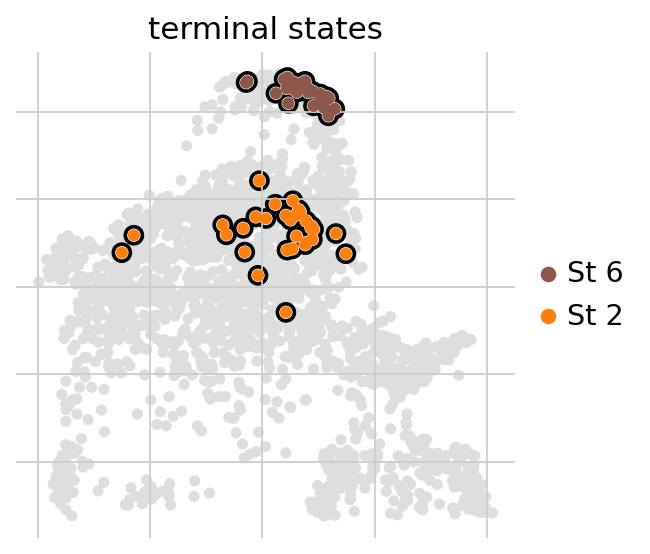

In [49]:
g.predict_terminal_states()
g.plot_macrostates(which="terminal", legend_loc="right", s=100)

/usr/local/lib/python3.11/dist-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/usr/local/lib/python3.11/dist-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/usr/local/lib/python3.11/dist-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/usr/local/lib/python3.11/dist-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and wi

saving figure to file ./figures/scvelo_UW14_terminal_stateL.pdf


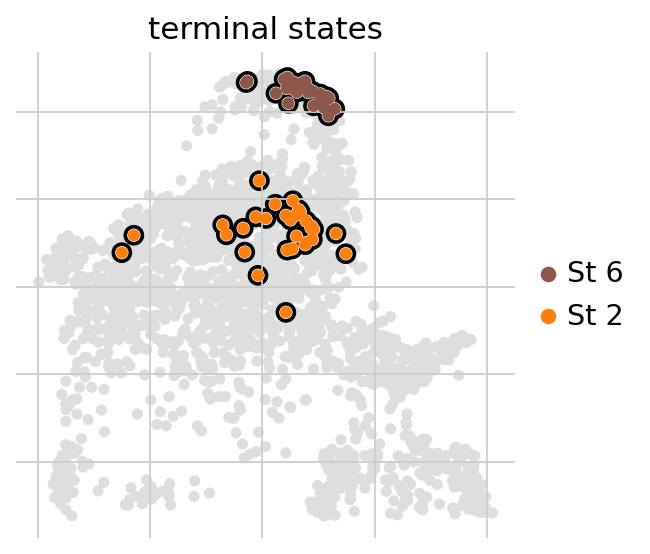

In [51]:
g.plot_macrostates(which="terminal", legend_loc="right", s=100, save = "UW14_terminal_stateL.pdf")

/usr/local/lib/python3.11/dist-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/usr/local/lib/python3.11/dist-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/usr/local/lib/python3.11/dist-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/usr/local/lib/python3.11/dist-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and wi

saving figure to file ./figures/scvelo_UW14_terminalStates.pdf


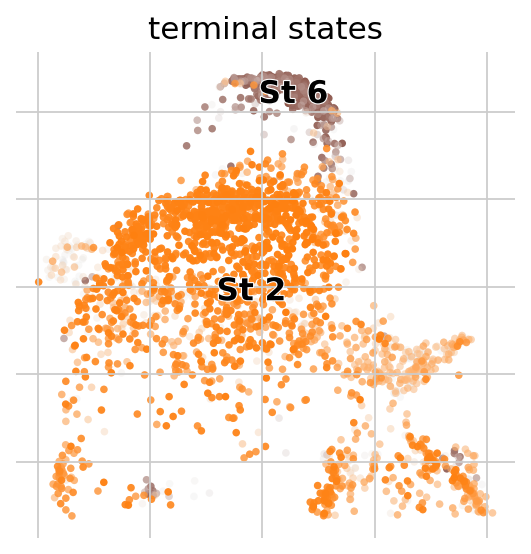

In [50]:
g.plot_macrostates(which="terminal", discrete=False, save = "UW14_terminalStates.pdf")

In [ ]:
g2 = cr.estimators.GPCCA(vk)
print(g2)

GPCCA[kernel=VelocityKernel[n=2586], initial_states=None, terminal_states=None]


Computing Schur decomposition
When computing macrostates, choose a number of states NOT in `[7, 11, 15, 17]`
Adding `adata.uns['eigendecomposition_fwd']`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:21)


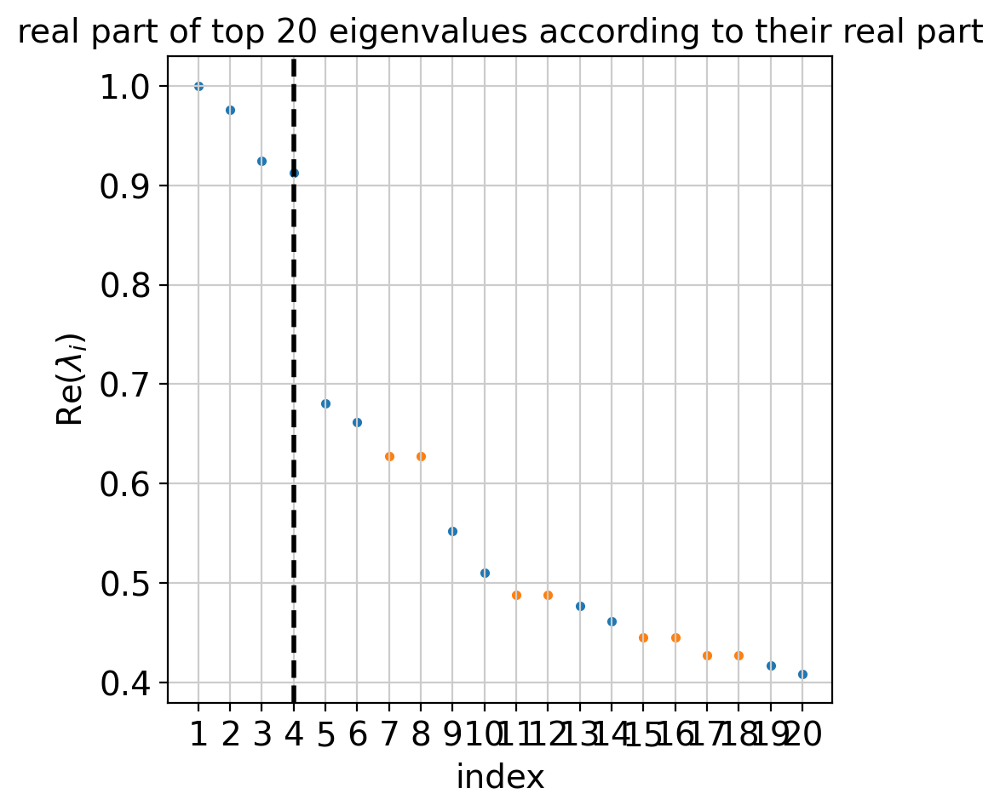

In [52]:
g.compute_schur()
g.plot_spectrum(real_only=True)

Computing fate probabilities


  0%|          | 0/2 [00:00<?, ?/s]

Adding `adata.obsm['lineages_fwd']`
       `.fate_probabilities`
    Finish (0:00:00)
saving figure to file ./figures/scvelo_UW14_state_fateProbabilty.pdf


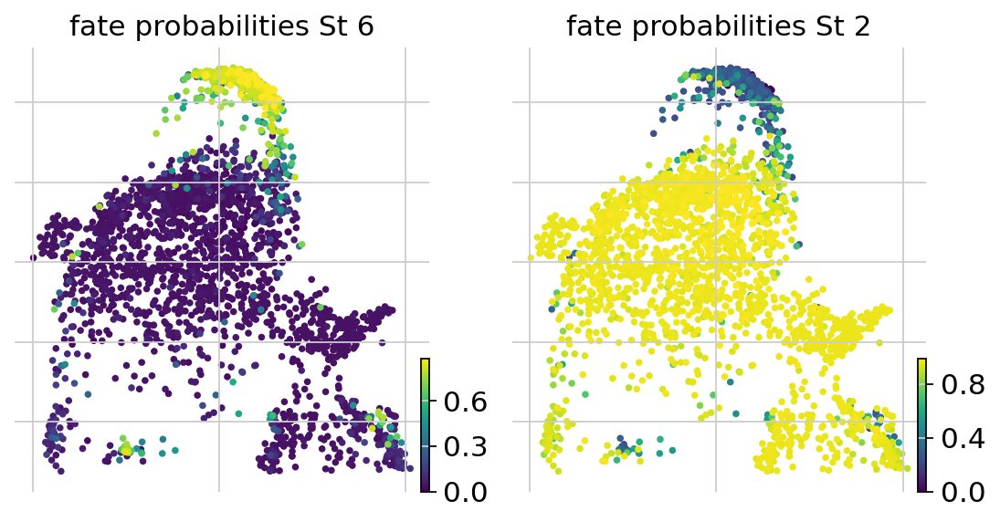

In [54]:
g.compute_fate_probabilities(solver='direct')
g.plot_fate_probabilities(same_plot=False, save="UW14_state_fateProbabilty.pdf")

/usr/local/lib/python3.11/dist-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/usr/local/lib/python3.11/dist-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/usr/local/lib/python3.11/dist-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/usr/local/lib/python3.11/dist-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and wi

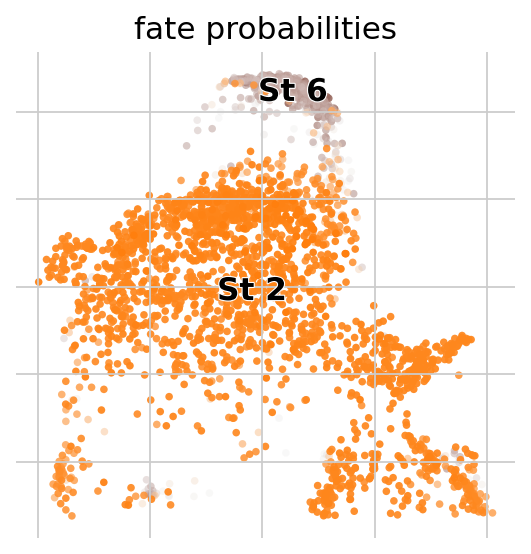

In [55]:
g.plot_fate_probabilities(same_plot=True)

In [56]:
cr.pl.circular_projection(adata_new, keys=["cell_state", "clusters_gradient"], legend_loc="right")

ValueError: Expected at least `3` lineages, found `2`.

In [57]:
st_list = ['St_1']

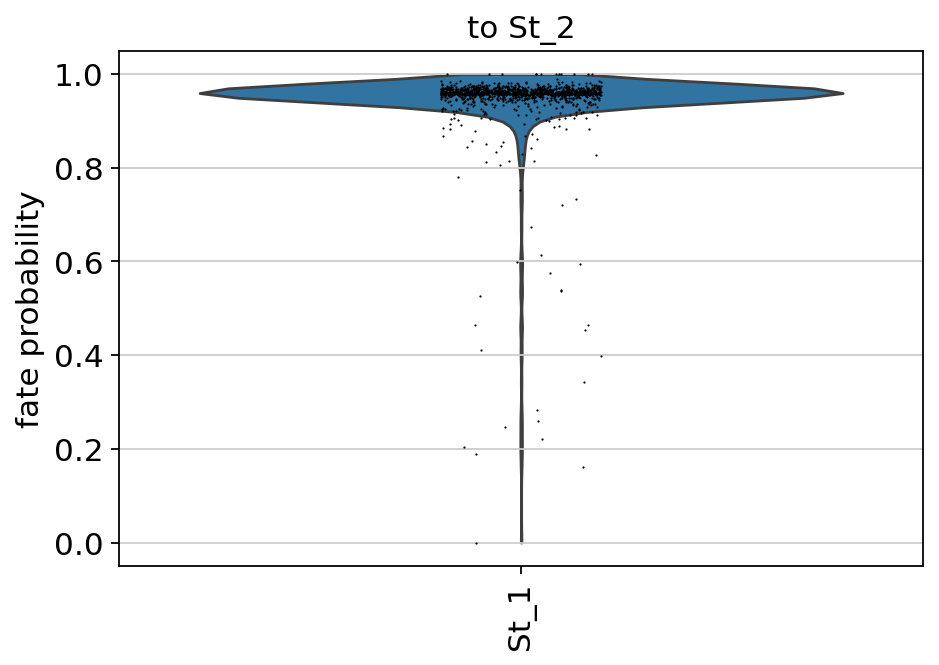

In [91]:
cr.pl.aggregate_fate_probabilities(
    adata_new,
    mode="violin",
    lineages=["St_2"],
    cluster_key="cell_state",
    clusters=st_list,
    save= "UW14_fateProbabitly_St2.pdf"
)

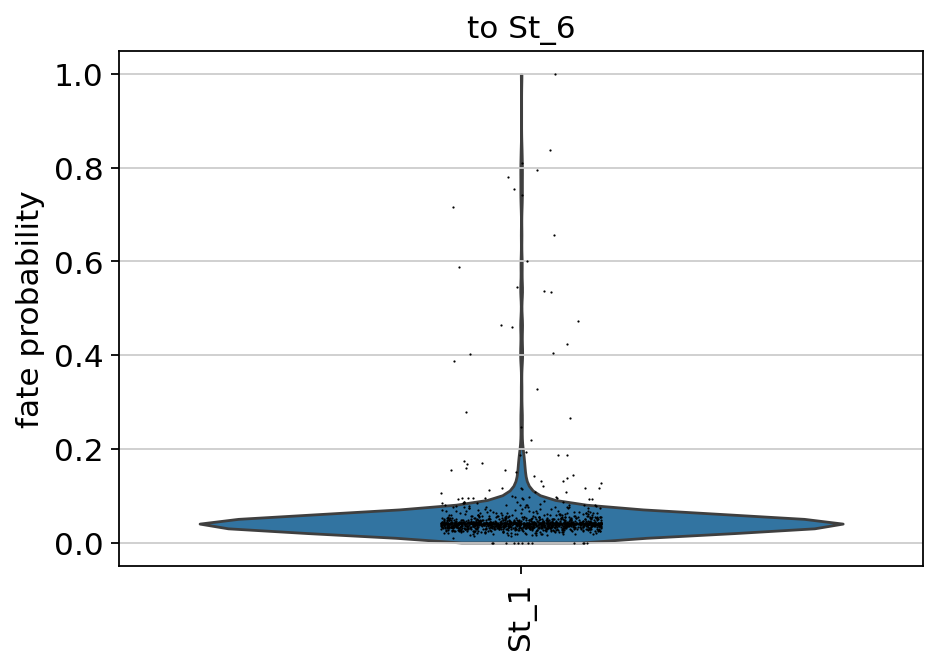

In [92]:
cr.pl.aggregate_fate_probabilities(
    adata_new,
    mode="violin",
    lineages=["St_6"],
    cluster_key="cell_state",
    clusters= st_list,
    save="UW14_fate_probabilty_St6.pdf"
)

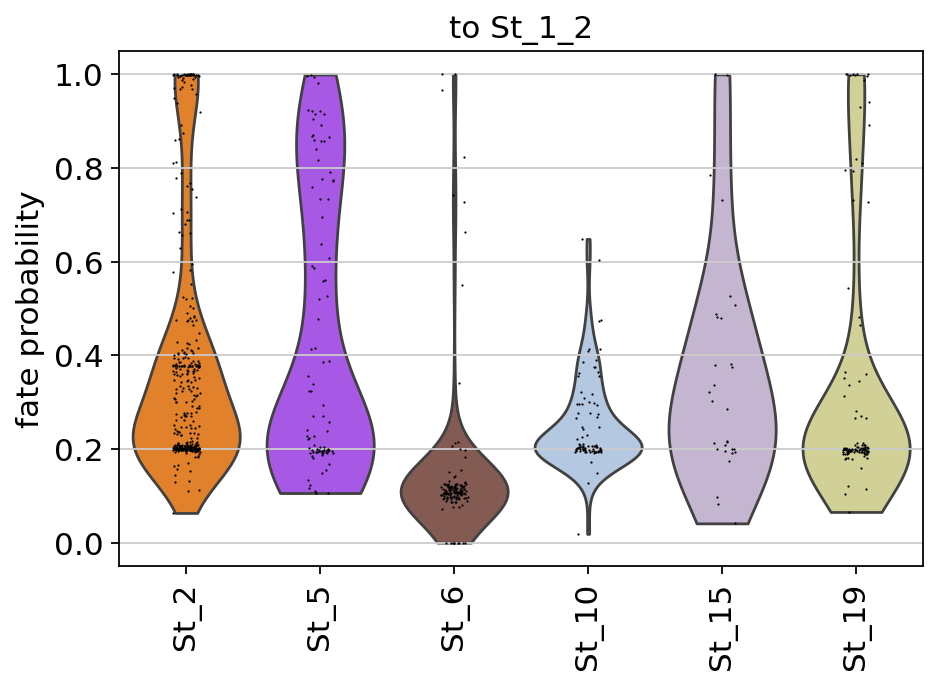

In [ ]:
cr.pl.aggregate_fate_probabilities(
    adata,
    mode="violin",
    lineages=["St_1_2"],
    cluster_key="cell_state",
    clusters=fev_states,
)

In [60]:
import statistics


In [86]:
adata_new.obs["fate_probabilities_st6"] = g.fate_probabilities["St_6"].X.flatten()

In [71]:
#adata_new.obs["fate_probabilities_st1"] = g.fate_probabilities["St_1"].X.flatten()

In [ ]:
#adata_new.obs["fate_probabilities_st1b"] = g.fate_probabilities["St_1_1"].X.flatten()

In [87]:
adata_new.obs["fate_probabilities_st2"] = g.fate_probabilities["St_2"].X.flatten()

In [88]:
adata_S1 = adata_new[adata_new.obs['cell_state'].isin(['St_1'])]
#adata_S5 = adata[adata.obs['cell_state'].isin(['St_5'])]
#adata_S16 = adata[adata.obs['cell_state'].isin(['St_16'])]
#adata_S14 = adata[adata.obs['cell_state'].isin(['St_14'])]
#adata_S12 = adata[adata.obs['cell_state'].isin(['St_12'])]
#adata_S17 = adata[adata.obs['cell_state'].isin(['St_17'])]
#adata_S21 = adata[adata.obs['cell_state'].isin(['St_21'])]
#adata_S15 = adata[adata.obs['cell_state'].isin(['St_15'])]
adata_S6 = adata_new[adata_new.obs['cell_state'].isin(['St_6'])]
adata_S2 = adata_new[adata_new.obs['cell_state'].isin(['St_2'])]
#adata_S4 = adata[adata.obs['cell_state'].isin(['St_4'])]
#adata_S10 = adata[adata.obs['cell_state'].isin(['St_10'])]
#adata_S9 = adata[adata.obs['cell_state'].isin(['St_9'])]

In [85]:
adata_new.obs.columns

Index(['seurat_clusters', 'n_genes_by_counts', 'total_counts',
       'total_counts_mt', 'pct_counts_mt', 'cell_state', 'cellT_seurat',
       'n_counts', 'velocity_self_transition', 'root_cells', 'end_points',
       'velocity_pseudotime', 'latent_time', 'macrostates_fwd',
       'term_states_fwd', 'term_states_fwd_probs', 'clusters_gradients',
       'fate_probabilities_st1b', 'fate_probabilities_st6',
       'fate_probabilities_st2'],
      dtype='object')

In [89]:
statistics.median(adata_S1.obs["fate_probabilities_st2"])

0.959650797737946

In [90]:
statistics.median(adata_S2.obs["fate_probabilities_st6"])

0.03952160726114065

In [ ]:
#not revised

saving figure to file ./figures/scvelo_heatmap_scVelo-heatmap-latent_time.png


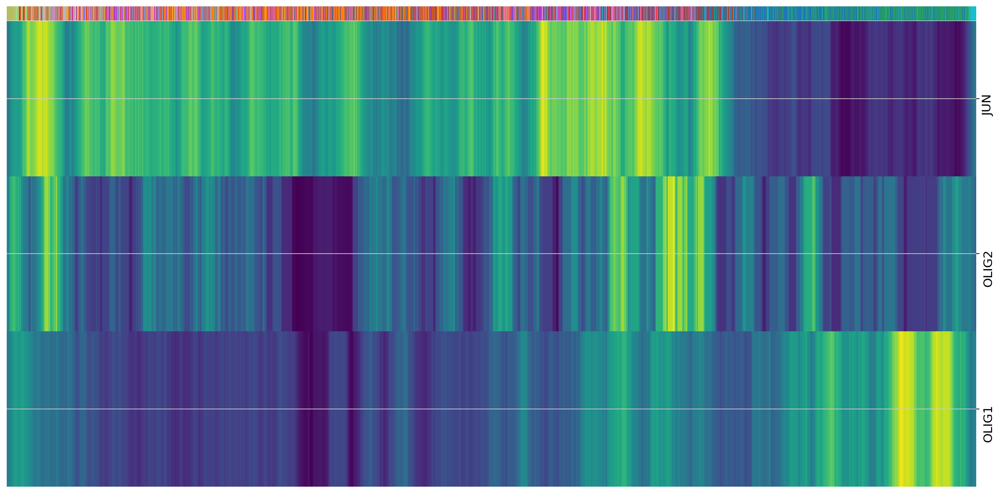

In [ ]:
Genes=["JUN","MTERF1","ZEB1","OLIG1","OLIG2","SOX2"]
scv.pl.heatmap(adata, var_names=Genes, sortby='latent_time', col_color='leiden', n_convolve=100,figsize=(16,8),yticklabels=True,sort=True,colorbar=True,show=True,layer="count", save='scVelo-heatmap-latent_time.png')

saving figure to file ./figures/scvelo_heatmap_scVelo-heatmap-latent_time.png


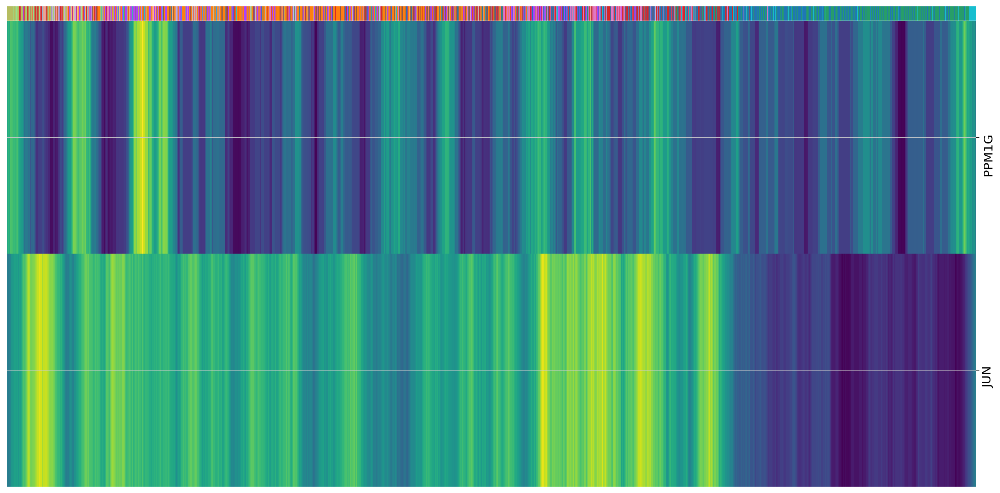

In [ ]:
Genes=["JUN","PPM1G","ARPP19","PDIA6","ABCE1","YWHAB"]
scv.pl.heatmap(adata, var_names=Genes, sortby='latent_time', col_color='leiden', n_convolve=100,figsize=(16,8),yticklabels=True,sort=True,colorbar=True,show=True,layer="count", save='scVelo-heatmap-latent_time.png')

saving figure to file ./figures/scvelo_heatmap_scVelo-heatmap-latent_time.png


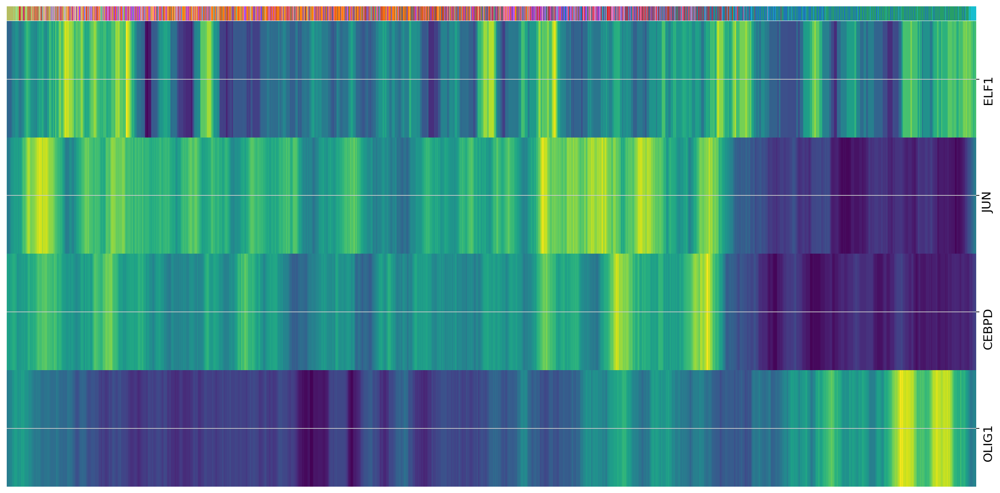

In [ ]:
Genes=["JUN","ELF1","CEBPD","IKZF2","OLIG1"]
scv.pl.heatmap(adata, var_names=Genes, sortby='latent_time', col_color='leiden', n_convolve=100,figsize=(16,8),yticklabels=True,sort=True,colorbar=True,show=True,layer="count", save='scVelo-heatmap-latent_time.png')

saving figure to file ./figures/scvelo_heatmap_scVelo-heatmap-latent_time.png


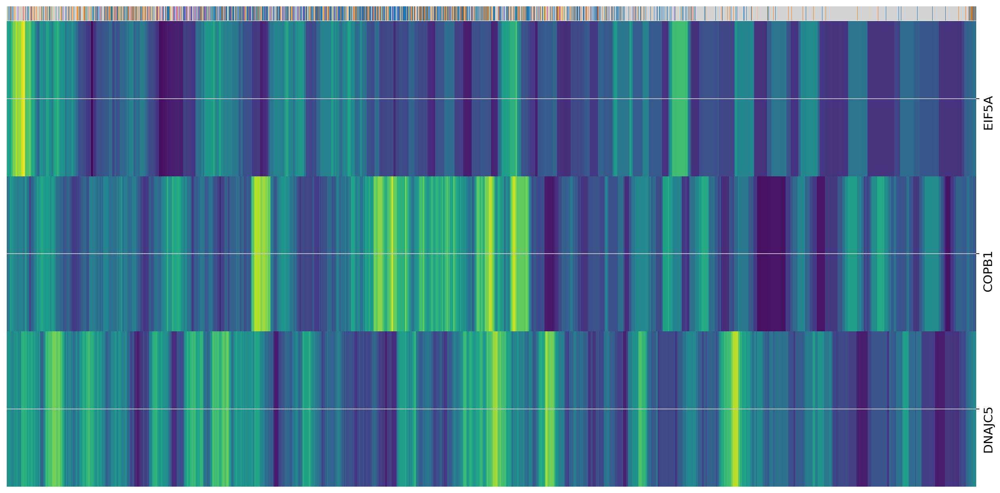

In [ ]:
Genes=["KDM3A","FBXO9","COPB1","EIF5A","DNAJC5","ARID3A"]
scv.pl.heatmap(adata, var_names=Genes, sortby='latent_time', col_color='cell_state', n_convolve=100,figsize=(16,8),yticklabels=True,sort=True,colorbar=True,show=True,layer="count", save='scVelo-heatmap-latent_time.png')

Computing trends using `1` core(s)


  0%|          | 0/6 [00:00<?, ?gene/s]

    Finish (0:00:04)
Plotting trends


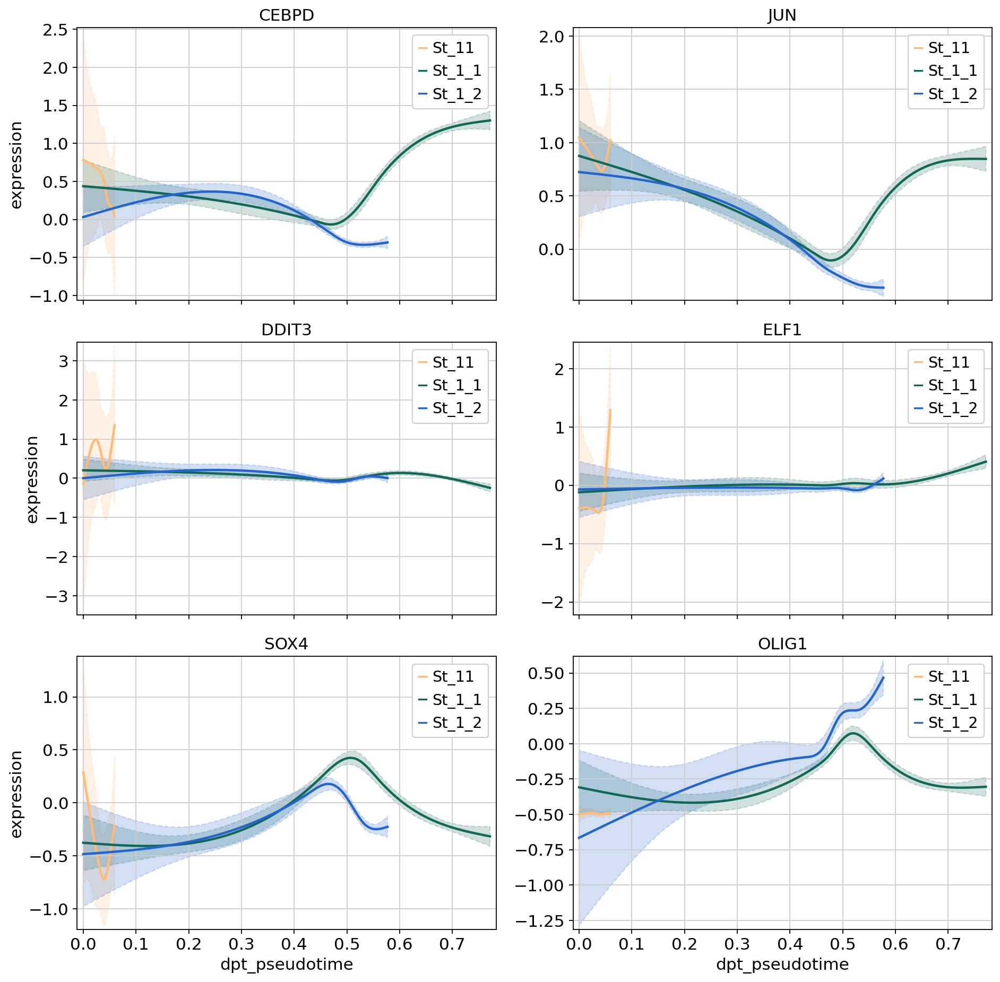

In [ ]:
cr.pl.gene_trends(
    adata,
    model=model,
    genes=["CEBPD","JUN","DDIT3","ELF1","SOX4","OLIG1"],
    same_plot=True,
    ncols=2,
    time_key="dpt_pseudotime",
    hide_cells=True,
    weight_threshold=(1e-3, 1e-3),
)

Computing trends using `1` core(s)


  0%|          | 0/6 [00:00<?, ?gene/s]

    Finish (0:00:02)


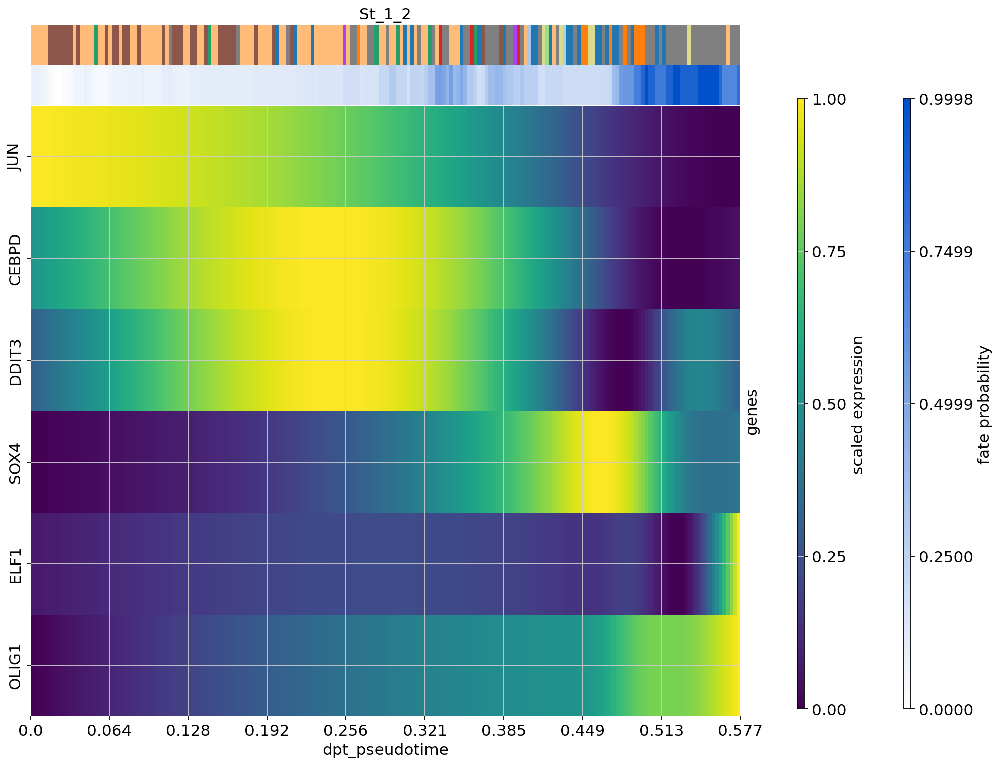

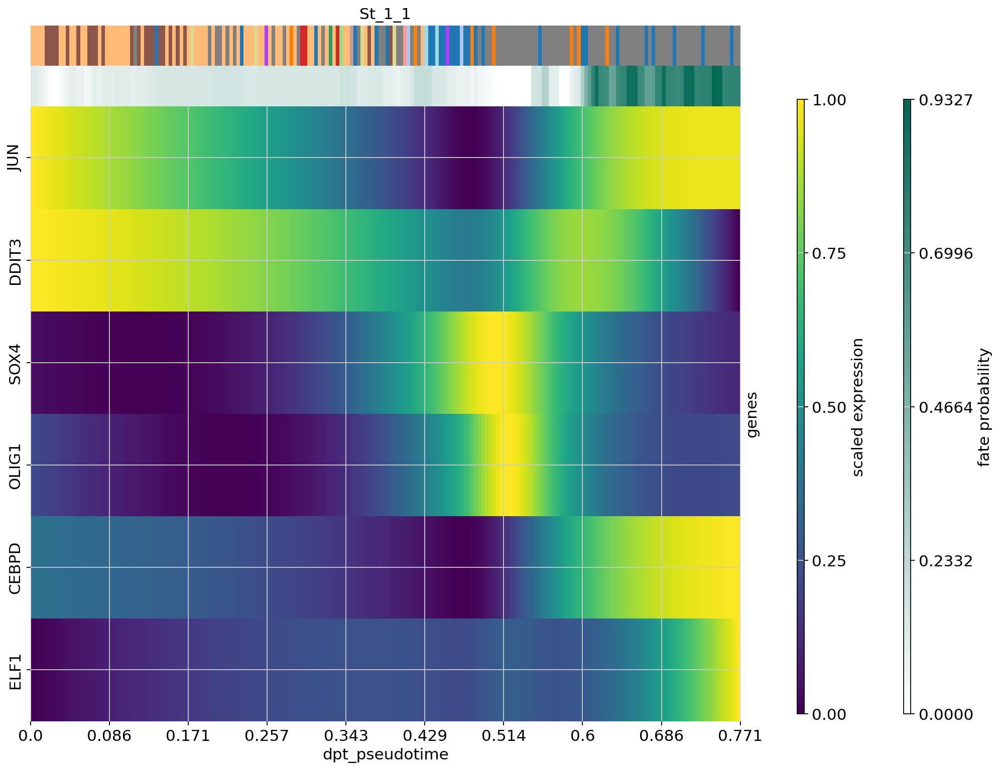

In [ ]:
#RNA vel monocle MINER
cr.pl.heatmap(
    adata,
    model=model,  # use the model from before
    lineages=["St_1_2","St_1_1"],
    cluster_key="cell_state",
    show_fate_probabilities=True,
    genes=["CEBPD","JUN","DDIT3","ELF1","SOX4","OLIG1"],
    time_key="dpt_pseudotime",
    figsize=(12, 10),
    show_all_genes=True,
    weight_threshold=(1e-3, 1e-3),
)

Computing trends using `1` core(s)


  0%|          | 0/3 [00:00<?, ?gene/s]

    Finish (0:00:01)


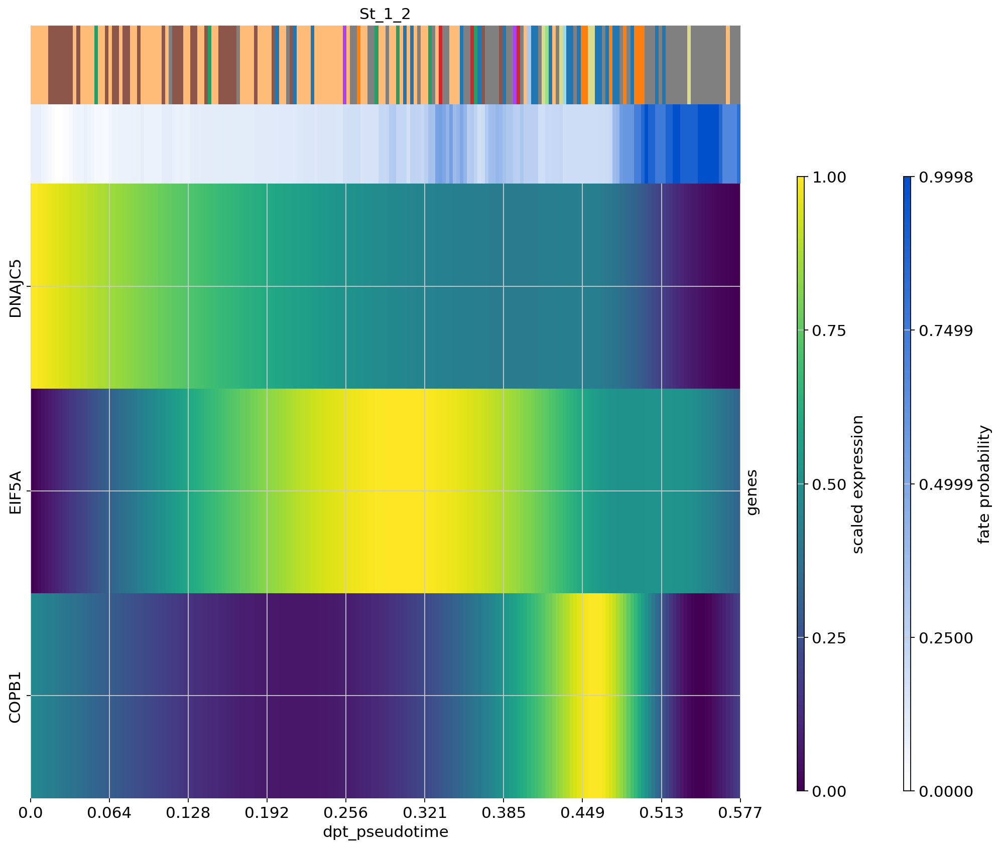

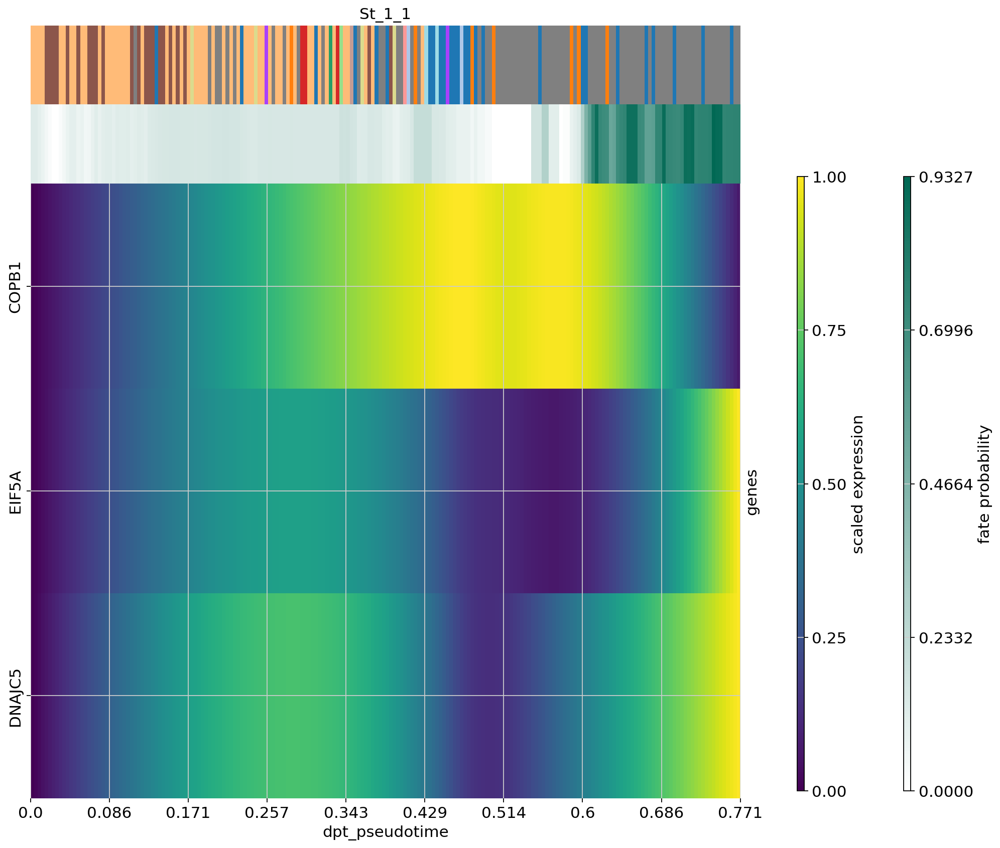

In [ ]:
#RNA vel monocle MINER
cr.pl.heatmap(
    adata,
    model=model,  # use the model from before
    lineages=["St_1_2","St_1_1"],
    cluster_key="cell_state",
    show_fate_probabilities=True,
    genes=["COPB1","EIF5A","DNAJC5"],
    time_key="dpt_pseudotime",
    figsize=(12, 10),
    show_all_genes=True,
    weight_threshold=(1e-3, 1e-3),
)

Computing trends using `1` core(s)


  0%|          | 0/3 [00:00<?, ?gene/s]

    Finish (0:00:01)


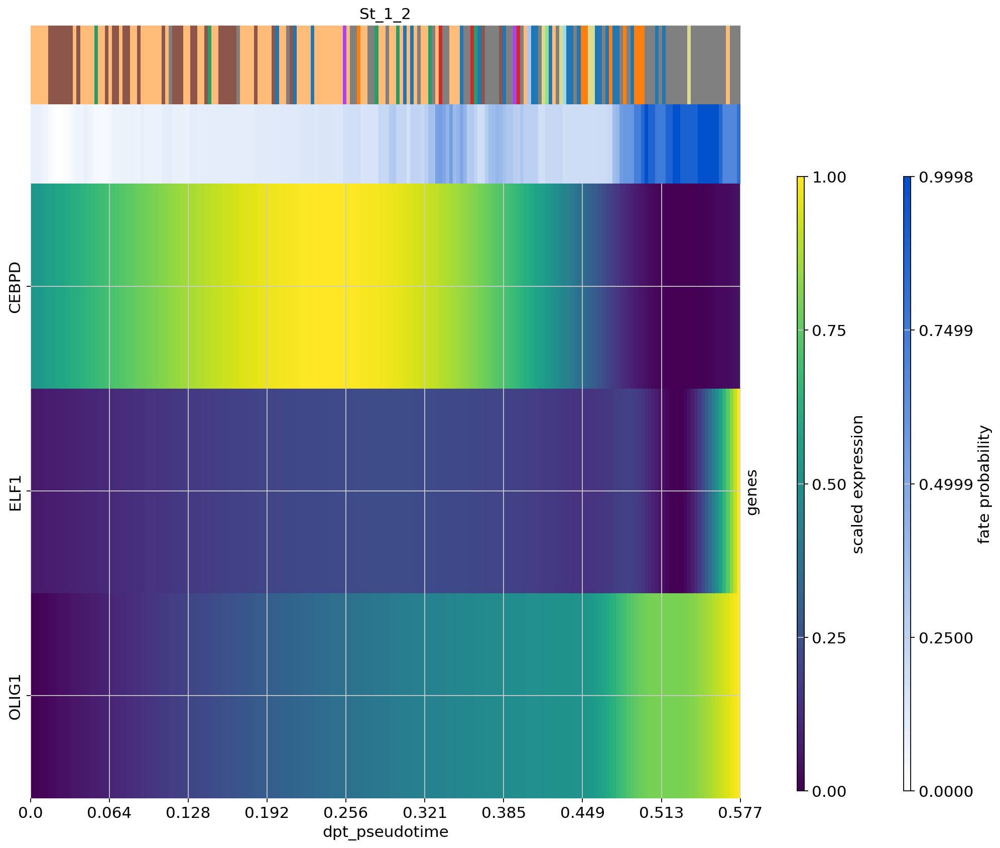

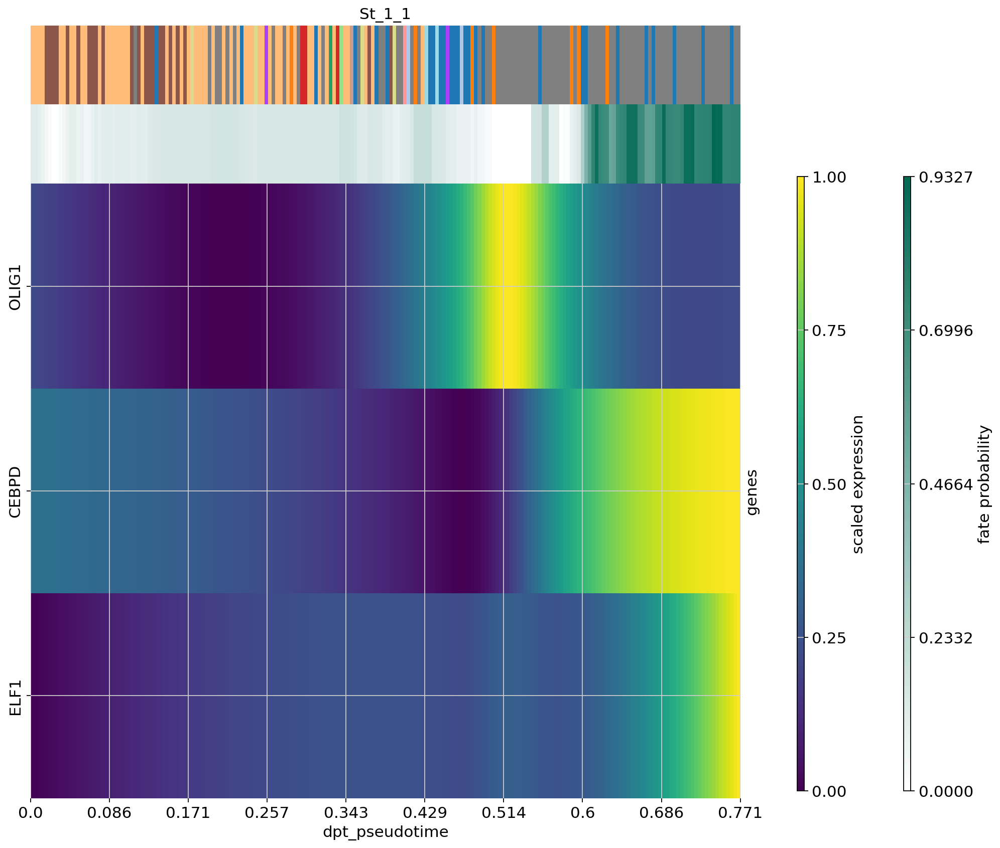

In [ ]:
#RNA vel monocle MINER
cr.pl.heatmap(
    adata,
    model=model,  # use the model from before
    lineages=["St_1_2","St_1_1"],
    cluster_key="cell_state",
    show_fate_probabilities=True,
    genes=["CEBPD","ELF1","OLIG1"],
    time_key="dpt_pseudotime",
    figsize=(12, 10),
    show_all_genes=True,
    weight_threshold=(1e-3, 1e-3),
)

Computing trends using `1` core(s)


  0%|          | 0/3 [00:00<?, ?gene/s]

    Finish (0:00:01)


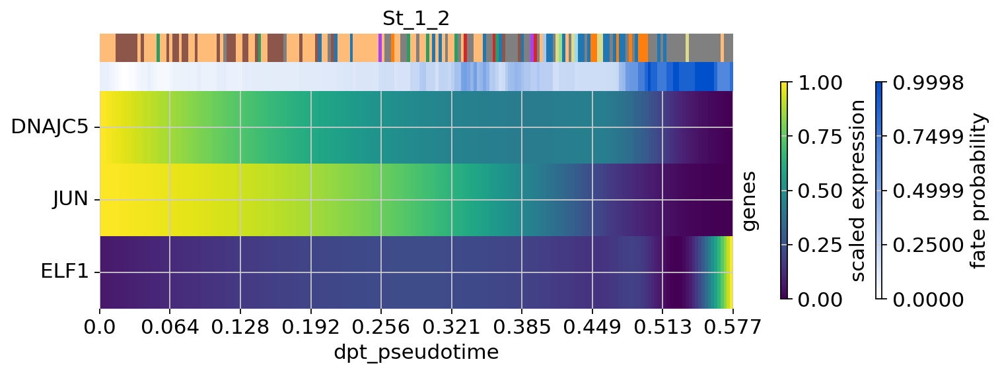

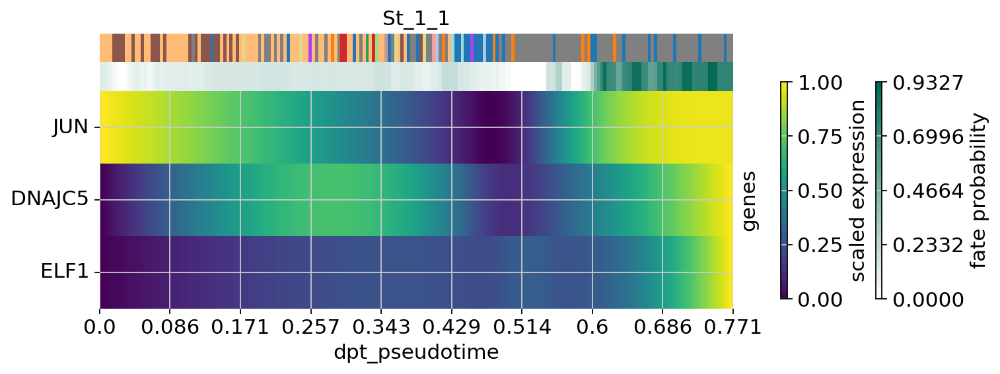

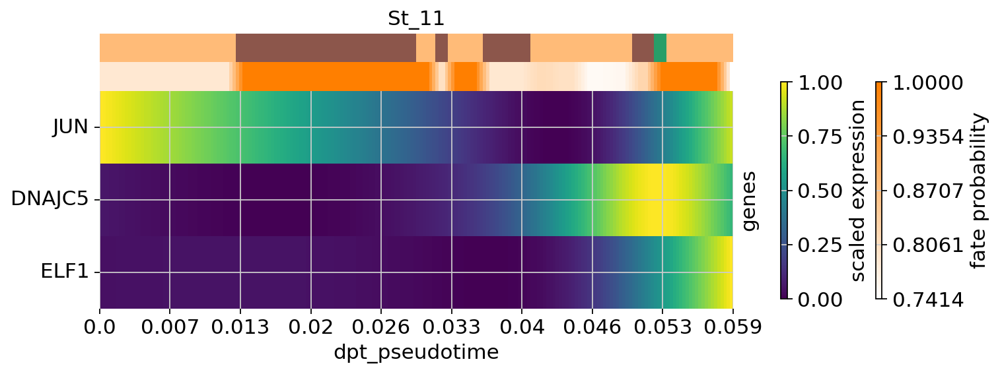

In [ ]:
cr.pl.heatmap(
    adata,
    model=model,  # use the model from before
    lineages=["St_1_2","St_1_1","St_11"],
    cluster_key="cell_state",
    show_fate_probabilities=True,
    genes=["DNAJC5","ELF1","JUN"],
    time_key="dpt_pseudotime",
    figsize=(9, 3),
    show_all_genes=True,
    weight_threshold=(1e-3, 1e-3),
)

In [ ]:
driver_clusters = ["St_2"]

delta_df = g2.compute_lineage_drivers(
    lineages=["St_1_2"], cluster_key="cell_state", clusters=driver_clusters
)
delta_df.head(40)

Adding `adata.varm['terminal_lineage_drivers']`
       `.lineage_drivers`
    Finish (0:00:03)


,St_1_2_corr,St_1_2_pval,St_1_2_qval,St_1_2_ci_low,St_1_2_ci_high
Gene,,,,,
SHTN1,0.684366,8.135267e-59,4.302743e-55,0.626599,0.734653
AL359091.1,0.676222,9.032129e-57,2.388547e-53,0.617304,0.727598
MBP,0.668398,7.051723e-55,1.243219e-51,0.608389,0.720808
AATK,0.573702,1.813885e-36,2.398409e-33,0.501674,0.637830
MOBP,0.566937,2.078508e-35,2.198646e-32,0.494133,0.631844
SLC24A2,0.542365,8.656995e-32,7.631141e-29,0.466836,0.610039
FRMD4B,0.505654,5.613298e-27,4.241248e-24,0.426319,0.577268
ATP8A1,0.479403,6.402721e-24,4.232999e-21,0.397541,0.553693
IL1RAPL1,0.457477,1.387956e-21,7.879923e-19,0.373628,0.533911


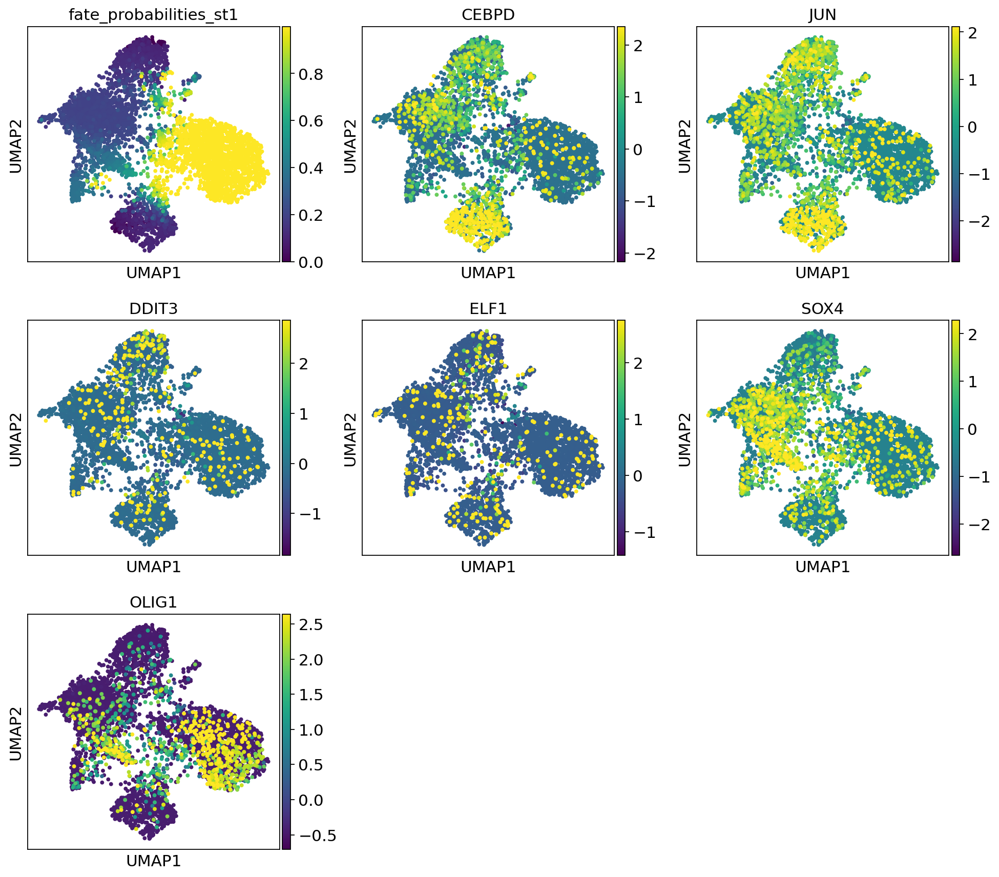

In [ ]:
adata.obs["fate_probabilities_st1"] = g2.fate_probabilities["St_1_2"].X.flatten()

sc.pl.embedding(
    adata,
    basis="umap",
    color=["fate_probabilities_st1"] + list(["CEBPD","JUN","DDIT3","ELF1","SOX4","OLIG1"]),
    color_map="viridis",
    s=50,
    ncols=3,
    vmax="p96",
)

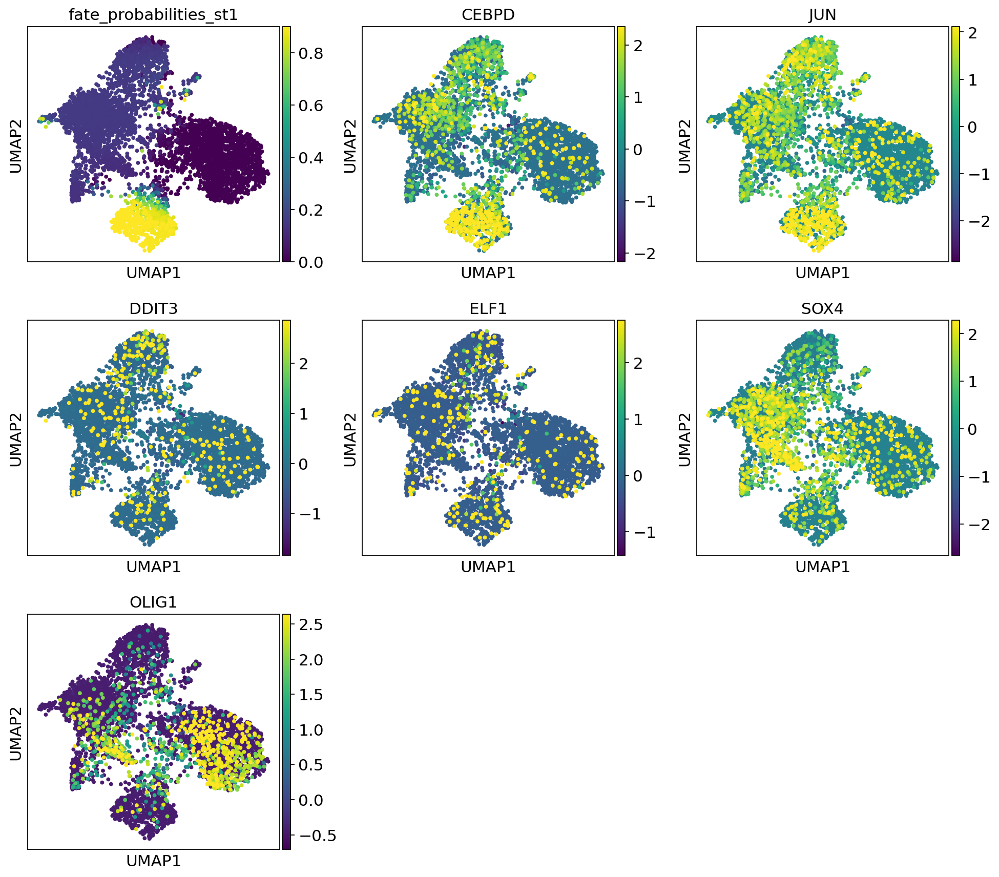

In [ ]:
adata.obs["fate_probabilities_st1"] = g2.fate_probabilities["St_1_1"].X.flatten()

sc.pl.embedding(
    adata,
    basis="umap",
    color=["fate_probabilities_st1"] + list(["CEBPD","JUN","DDIT3","ELF1","SOX4","OLIG1"]),
    color_map="viridis",
    s=50,
    ncols=3,
    vmax="p96",
)

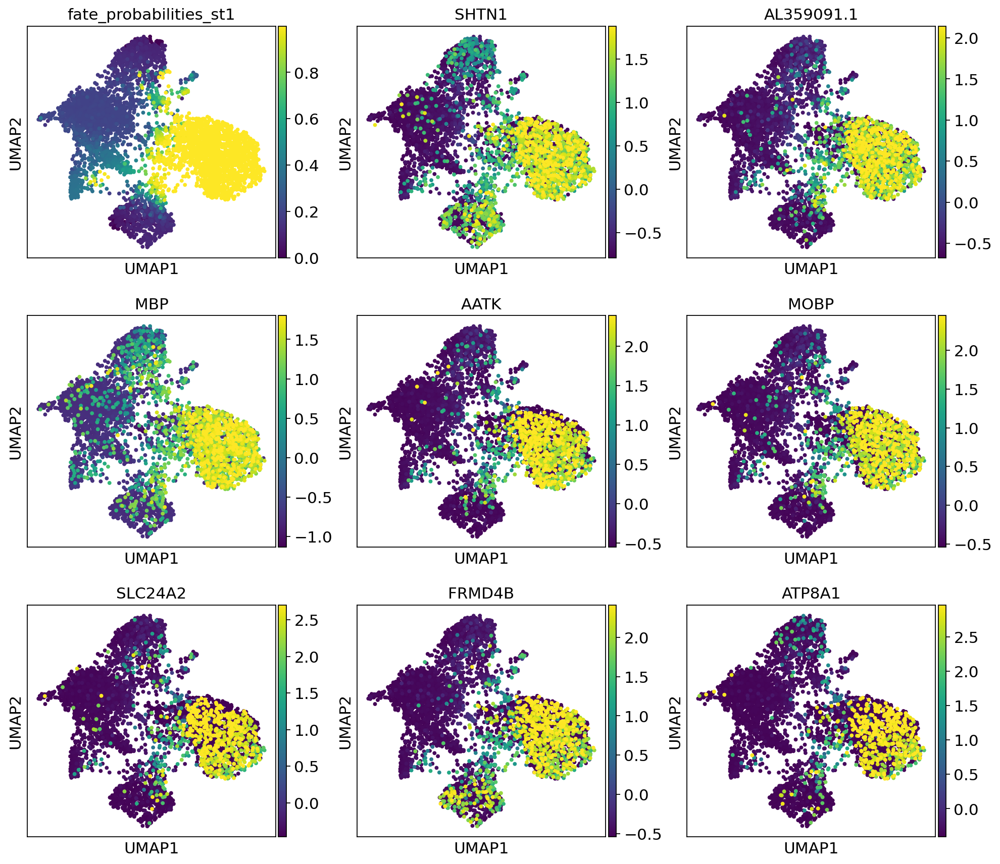

In [ ]:
adata.obs["fate_probabilities_st1"] = g2.fate_probabilities["St_1_2"].X.flatten()

sc.pl.embedding(
    adata,
    basis="umap",
    color=["fate_probabilities_st1"] + list(delta_df.index[:8]),
    color_map="viridis",
    s=50,
    ncols=3,
    vmax="p96",
)